In [1]:
from ultralytics import YOLO
import os
import shutil
from pathlib import Path
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import cv2
import numpy as np

In [2]:
# Configuration
MODEL_PATH = "./runs/detect/train/weights/best.pt"
INPUT_FOLDER = "../yellow_AP_057"  # Change this to your input folder path
OUTPUT_FOLDER = "./inference_results"
CONFIDENCE_THRESHOLD = 0.2

# Create output directories
schistosoma_dir = os.path.join(OUTPUT_FOLDER, "schistosoma")
empty_dir = os.path.join(OUTPUT_FOLDER, "empty")
os.makedirs(schistosoma_dir, exist_ok=True)
os.makedirs(empty_dir, exist_ok=True)

In [3]:
# Load the trained model
model = YOLO(MODEL_PATH)

# Get all image files from input folder
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif'}
image_files = [f for f in Path(INPUT_FOLDER).iterdir() 
               if f.suffix.lower() in image_extensions]

print(f"Processing {len(image_files)} images...")

# Counters
schistosoma_count = 0
empty_count = 0

# Store detection results for visualization (FIXED: only store essential data)
detection_results = []

# Process each image
for img_path in image_files:
    # Run inference
    results = model(img_path, conf=CONFIDENCE_THRESHOLD, verbose=False)
    
    # Check if any detections were made
    has_detection = len(results[0].boxes) > 0
    
    # Copy image to appropriate folder
    if has_detection:
        shutil.copy(img_path, os.path.join(schistosoma_dir, img_path.name))
        schistosoma_count += 1
        
        # FIXED: Extract only the data we need (boxes, confidences, classes)
        # Instead of storing the entire results object
        boxes = results[0].boxes.xyxy.cpu().numpy().copy()
        confidences = results[0].boxes.conf.cpu().numpy().copy()
        class_ids = results[0].boxes.cls.cpu().numpy().copy()
        
        detection_results.append({
            'path': str(img_path),  # Store as string, not Path object
            'filename': img_path.name,
            'num_detections': len(results[0].boxes),
            'boxes': boxes,
            'confidences': confidences,
            'class_ids': class_ids
        })
        
        print(f"✓ {img_path.name} -> schistosoma (detected {len(results[0].boxes)} eggs)")
    else:
        shutil.copy(img_path, os.path.join(empty_dir, img_path.name))
        empty_count += 1
        print(f"○ {img_path.name} -> empty")
    
    # IMPORTANT: Clear YOLO results from memory
    del results

Processing 440 images...
○ 2024-03-12_01-35-50-329414.jpg -> empty
○ 2024-03-12_01-26-47-102350.jpg -> empty
○ 2024-03-12_01-35-50-329414.jpg -> empty
○ 2024-03-12_01-26-47-102350.jpg -> empty
○ 2024-03-12_02-50-47-279148.jpg -> empty
○ 2024-03-12_01-47-06-299756.jpg -> empty
○ 2024-03-12_02-50-47-279148.jpg -> empty
○ 2024-03-12_01-47-06-299756.jpg -> empty
○ 2024-03-12_01-44-45-549419.jpg -> empty
○ 2024-03-12_02-51-11-262789.jpg -> empty
○ 2024-03-12_01-44-45-549419.jpg -> empty
○ 2024-03-12_02-51-11-262789.jpg -> empty
○ 2024-03-12_02-28-44-522528.jpg -> empty
○ 2024-03-12_01-25-11-511586.jpg -> empty
○ 2024-03-12_02-28-44-522528.jpg -> empty
○ 2024-03-12_01-25-11-511586.jpg -> empty
✓ 2024-03-12_02-19-44-516527.jpg -> schistosoma (detected 1 eggs)
✓ 2024-03-12_01-56-53-064872.jpg -> schistosoma (detected 1 eggs)
✓ 2024-03-12_02-19-44-516527.jpg -> schistosoma (detected 1 eggs)
✓ 2024-03-12_01-56-53-064872.jpg -> schistosoma (detected 1 eggs)
○ 2024-03-12_01-51-11-013797.jpg -> emp

In [4]:

# Print summary
print("\n" + "="*50)
print("INFERENCE SUMMARY")
print("="*50)
print(f"Total images processed: {len(image_files)}")
print(f"Images with schistosoma eggs (≥{CONFIDENCE_THRESHOLD} confidence): {schistosoma_count}")
print(f"Empty images: {empty_count}")
print(f"\nResults saved to: {OUTPUT_FOLDER}")


INFERENCE SUMMARY
Total images processed: 440
Images with schistosoma eggs (≥0.2 confidence): 129
Empty images: 311

Results saved to: ./inference_results


## Visualize Detections with Bounding Boxes

In [5]:
def draw_detections_on_image(img_path, boxes, confidences, class_ids):
    """
    Draw bounding boxes on image with labels and confidence scores.
    
    Args:
        img_path: Path to the image
        boxes: Numpy array of box coordinates
        confidences: Numpy array of confidence scores
        class_ids: Numpy array of class IDs
        
    Returns:
        Annotated image in RGB format
    """
    # Read image
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Draw each detection
    for box, conf, cls_id in zip(boxes, confidences, class_ids):
        x1, y1, x2, y2 = map(int, box)
        
        # Draw bounding box
        cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
        
        # Prepare label with class and confidence
        label = f"Parasite {conf:.2f}"
        
        # Draw label background
        (label_w, label_h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(img_rgb, (x1, y1 - label_h - 10), (x1 + label_w, y1), (0, 255, 0), -1)
        
        # Draw label text
        cv2.putText(img_rgb, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 
                    0.5, (0, 0, 0), 1, cv2.LINE_AA)
    
    return img_rgb


Displaying top images with most detections:
1. 2024-03-12_02-50-12-583704.jpg - 5 parasite(s)
1. 2024-03-12_02-50-12-583704.jpg - 5 parasite(s)
2. 2024-03-12_02-50-21-560654.jpg - 4 parasite(s)
2. 2024-03-12_02-50-21-560654.jpg - 4 parasite(s)
3. 2024-03-12_02-50-16-413384.jpg - 4 parasite(s)
3. 2024-03-12_02-50-16-413384.jpg - 4 parasite(s)
4. 2024-03-12_02-50-25-286167.jpg - 4 parasite(s)
4. 2024-03-12_02-50-25-286167.jpg - 4 parasite(s)
5. 2024-03-12_01-27-56-302240.jpg - 3 parasite(s)
5. 2024-03-12_01-27-56-302240.jpg - 3 parasite(s)
6. 2024-03-12_01-42-01-218326.jpg - 3 parasite(s)
6. 2024-03-12_01-42-01-218326.jpg - 3 parasite(s)
7. 2024-03-12_02-50-13-799316.jpg - 3 parasite(s)
7. 2024-03-12_02-50-13-799316.jpg - 3 parasite(s)
8. 2024-03-12_01-29-48-381049.jpg - 2 parasite(s)
8. 2024-03-12_01-29-48-381049.jpg - 2 parasite(s)
9. 2024-03-12_01-45-35-791004.jpg - 2 parasite(s)
9. 2024-03-12_01-45-35-791004.jpg - 2 parasite(s)
10. 2024-03-12_01-50-17-087970.jpg - 2 parasite(s)
10. 

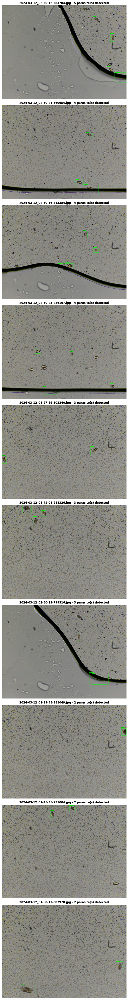

In [6]:
if detection_results:
    # Display top 10 images with most detections
    top_detections = sorted(detection_results, key=lambda x: x['num_detections'], reverse=True)[:10]
    
    num_images = len(top_detections)
    
    # Create figure with subplots
    fig, axes = plt.subplots(num_images, 1, figsize=(12, 6*num_images))
    
    # Handle case where there's only one image
    if num_images == 1:
        axes = [axes]
    
    print("\nDisplaying top images with most detections:")
    print("=" * 70)
    
    for idx, detection in enumerate(top_detections):
        # Draw bounding boxes on image using extracted data
        img_annotated = draw_detections_on_image(
            detection['path'],
            detection['boxes'],
            detection['confidences'],
            detection['class_ids']
        )
        
        # Display image
        axes[idx].imshow(img_annotated)
        axes[idx].set_title(f"{detection['filename']} - {detection['num_detections']} parasite(s) detected", 
                           fontsize=12, fontweight='bold')
        axes[idx].axis('off')
        
        print(f"{idx+1}. {detection['filename']} - {detection['num_detections']} parasite(s)")
        
        # Free memory after displaying
        del img_annotated
    
    plt.tight_layout()
    plt.show()
    
    print("=" * 70)
else:
    print("\nNo detections to visualize.")